In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

from pathlib import Path


In [2]:
results_path = Path("./results").expanduser()

dfs = []

# read all of the CSVs into pandas DataFrames
for filename in results_path.glob("**/*.csv"):
    try:
        df = pd.read_csv(filename, index_col=None, header=0)
        dfs.append(df)
    except UnicodeDecodeError as e:
        print(e)
        print(filename)
        /scratch/ead54/miniconda3/envs/blt-env/bin/python

# combine all of the DFs into one big DF and drop columns we don't need
res_df = pd.concat(dfs, axis=0, ignore_index=True).drop(labels=["batch_size", "epochs", "weight_decay", "learning_rate", "momentum", "early_stop", "use_val", "prune_lamb", "p_drop"], axis=1)

KeyError: "['batch_size' 'epochs' 'learning_rate' 'momentum' 'early_stop' 'use_val'\n 'prune_locally' 'n_prune_iters' 'prune_lamb'] not found in axis"

# This is a helper function for filtering out the useful data for plotting

In [ ]:
def filter_results(df, model="resnet18", dataset=None, prune_percent=None, prune_method=None, swag_lrs=None,
                   pred_lambs=None, modes=None, scalings=None, hessian_method=None, filter_dict={}):
    # make a copy of the DataFrame else Pandas complains
    df = df.copy(deep=True)

    filter_dict.update({"model": model})
    if dataset is not None:
        filter_dict.update({"dataset": dataset})
    # only keep rows in which the value of each column with the same name as one
    # of the keys in filter dict matches the corresponding value
    df = df.loc[(df[list(filter_dict)] == pd.Series(filter_dict)).all(axis=1)]

    # if prune_method or prune_percent is specified filter on the specified value + the
    # value corresponding to map predictions since we don't want to throw those away
    if prune_method is not None:
        df = df[df.prune_method.isin([prune_method, ""])]
    if prune_percent is not None:
        df = df[df.prune_percent.isin([prune_percent, 0])]
    if hessian_method is not None:
        df = df[df.hessian_method.isin([hessian_method, ""])]

    # if modes are specified filter based on them
    if modes is not None:
        df = df[df["mode"].isin(modes)]
    if pred_lambs is not None:
        df = df[df["pred_lamb"].isin(pred_lambs)]
    if scalings is not None:
        df = df[df["scaling"].isin(scalings + [-1.0])]
        
    if swag_lrs is not None:
        df = df[~df["swag_lr"].isin(swag_lrs)]

    return df


In [101]:
# deault seaborn fails if you need more than 6 markers/dash_styles so I've dfeined some here
markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')
dash_styles = ["",
               (5, 0.5),
               (4, 1.5),
               (1, 1),
               (3, 1, 1.5, 1),
               (5, 1, 1, 1),
               (5, 1, 2, 1, 2, 1),
               (2, 2, 3, 1.5),
               (1, 2.5, 3, 1.2)]

### Plotting Rotated MNIST

In [25]:
# select what to plot
method="min-wass-swag"
modes = ["map", "linearized_approx"]
pred_lambs = [500.0, np.Inf]
tmp_df = filter_results(res_df, dataset="MNIST", prune_percent=99.62, prune_method=method,
                        pred_lambs=pred_lambs, modes=modes, filter_dict={})

# because we are collecting results for different numbers of samples, we need to filter out 
# predictions for numbers of samples we don't care about. I've chosen to always use the predictions 
# with the maximum number of samples, which is what the following code does. 
# Not doing this will cause the error bars in the plots to be calculated for both mode training 
# reps and different numbers of samples.
tmp_df = tmp_df.sort_values(by="n_samples").groupby(["mode", "prune_percent", "prune_method", "rotation", "corruption", "target_dataset", "pred_lamb", "number"]).nth(-1).reset_index()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize = (15, 20), dpi=400)
ax1.set_title(f"{method} subnetwork selection")

sns.lineplot(data=tmp_df, x="rotation", y="ll", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax1,
             legend=False)
sns.lineplot(data=tmp_df, x="rotation", y="err", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax2,
             legend=False)
sns.lineplot(data=tmp_df, x="rotation", y="ece", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax3,
             legend=False)
sns.lineplot(data=tmp_df, x="rotation", y="brier", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax4)

plt.savefig(f"mnist_rot_{method}.png")

RuntimeError: latex was not able to process the following string:
b'linearized_approx'

Here is the full report generated by latex:
This is pdfTeX, Version 3.1415926-2.5-1.40.14 (TeX Live 2013)
 restricted \write18 enabled.
entering extended mode
(/home/jua23/.cache/matplotlib/tex.cache/e4dc8aca15f122aefa763c8e8dae3103.tex
LaTeX2e <2011/06/27>
Babel <v3.8m> and hyphenation patterns for english, dumylang, nohyphenation, lo
aded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2007/10/19 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/mathpazo.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./e4dc8aca15f122aefa763c8e8dae3103.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/ot1ppl.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...{6.000000}{7.500000}{\rmfamily linearized_
                                                  approx}
No pages of output.
Transcript written on e4dc8aca15f122aefa763c8e8dae3103.log.




RuntimeError: latex was not able to process the following string:
b'linearized_approx'

Here is the full report generated by latex:
This is pdfTeX, Version 3.1415926-2.5-1.40.14 (TeX Live 2013)
 restricted \write18 enabled.
entering extended mode
(/home/jua23/.cache/matplotlib/tex.cache/e4dc8aca15f122aefa763c8e8dae3103.tex
LaTeX2e <2011/06/27>
Babel <v3.8m> and hyphenation patterns for english, dumylang, nohyphenation, lo
aded.
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2007/10/19 v1.4h Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/mathpazo.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.def))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/utf8.def
(/usr/share/texlive/texmf-dist/tex/latex/base/t1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ot1enc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/omsenc.dfu)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1enc.dfu)))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/share/texlive/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifpdf.sty)
(/usr/share/texlive/texmf-dist/tex/generic/oberdiek/ifvtex.sty)
(/usr/share/texlive/texmf-dist/tex/generic/ifxetex/ifxetex.sty)

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (./e4dc8aca15f122aefa763c8e8dae3103.aux)
(/usr/share/texlive/texmf-dist/tex/latex/base/ts1cmr.fd)
(/usr/share/texlive/texmf-dist/tex/latex/psnfss/ot1ppl.fd)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...{6.000000}{7.500000}{\rmfamily linearized_
                                                  approx}
No pages of output.
Transcript written on e4dc8aca15f122aefa763c8e8dae3103.log.




<Figure size 6000x8000 with 4 Axes>

### Plotting CIFAR10 Corruption Robustness


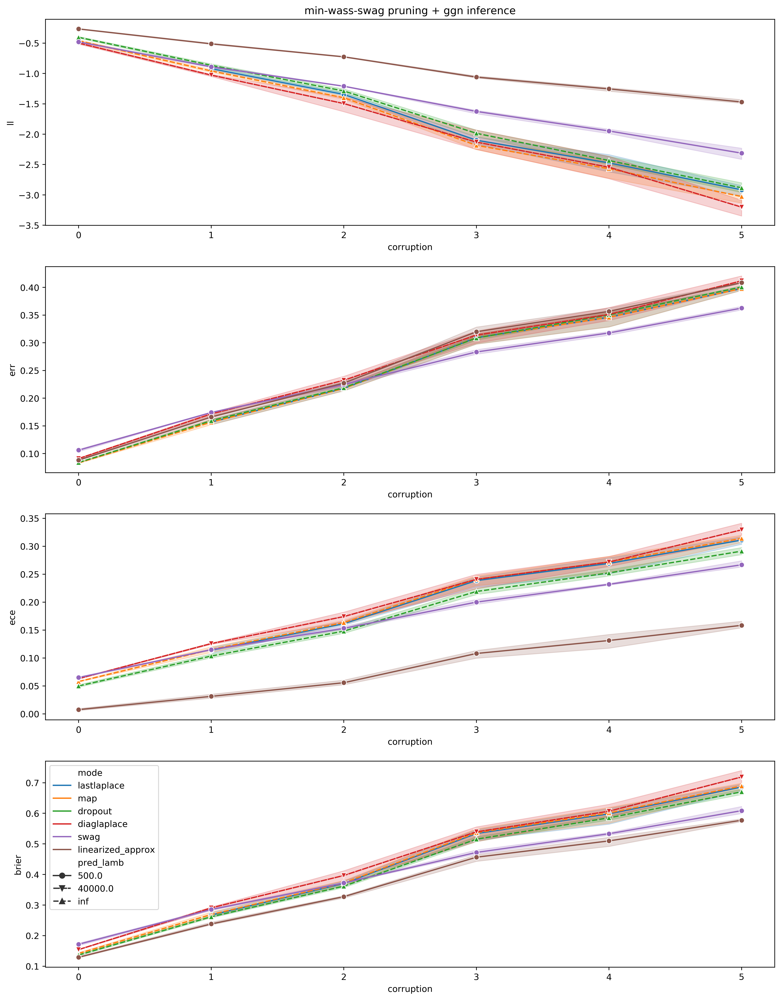

In [7]:
# sns.set_style("darkgrid", {"axes.facecolor": ".9"})

# select what to plot
method="min-wass-swag"
modes = ["linearized_approx", "map"]
pred_lambs = [500.0, np.Inf]
scalings = [0.00001]
diaglaplace_lamb = 40000.0

for scaling in scalings:
    tmp_df = filter_results(res_df, dataset="CIFAR10", prune_percent=99.62, prune_method=method,
                            pred_lambs=pred_lambs, diaglaplace_lamb=diaglaplace_lamb, modes=modes, scalings=[scaling], filter_dict={})

    # because we are collecting results for different numbers of samples, we need to filter out 
    # predictions for numbers of samples we don't care about. I've chosen to always use the predictions 
    # with the maximum number of samples, which is what the following code does. 
    # Not doing this will cause the error bars in the plots to be calculated for both mode training 
    # reps and different numbers of samples.
    #tmp_df = tmp_df.sort_values(by="n_samples").groupby(["mode", "prune_percent", "prune_method", "rotation", "corruption", "target_dataset", "pred_lamb", "scaling", "hessian_method", "number"]).nth(-1).reset_index()

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1, figsize = (15, 20), dpi=400)
    ax1.set_title(f"{method} pruning")

    sns.lineplot(data=tmp_df, x="corruption", y="ll", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax1,
             legend=False)
    sns.lineplot(data=tmp_df, x="corruption", y="err", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax2,
             legend=False)
    sns.lineplot(data=tmp_df, x="corruption", y="ece", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax3,
             legend=False)
    sns.lineplot(data=tmp_df, x="corruption", y="brier", hue="mode", style="pred_lamb", markers=markers,
             dashes=dash_styles, ax=ax4)
    plt.savefig(f"cifar_cor_{method}.png")


### Plotting Rejection Classification

Take a look here: https://github.com/JavierAntoran/arq_uncertainty/blob/NeurIPS_release/experiments/regression_and_image_PLOTS.ipynb

In [6]:
def errorfill(x, y, yerr, color=None, alpha_fill=0.3, line_alpha=1, ax=None, lw=1, linestyle='-', fill_linewidths=0.2, **kwargs):
    ax = ax if ax is not None else plt.gca()
    if color is None:
        color = ax._get_lines.color_cycle.next()
    if np.isscalar(yerr) or len(yerr) == len(y):
        ymin = y - yerr
        ymax = y + yerr
    elif len(yerr) == 2:
        ymin, ymax = yerr
    plt_return = ax.plot(x, y, color=color, lw=lw, linestyle=linestyle, alpha=line_alpha)
    ax.fill_between(x, ymax, ymin, color=color, alpha=alpha_fill, linewidths=fill_linewidths)
    return plt_return

In [7]:
def plot_err_props(df, conditions, add_cond, ax, formatting, **kwargs):
    filt = (df[list(conditions)] == pd.Series(conditions)).all(axis=1)
    df_filt = df[filt].dropna(subset=['cr_err'])
        
    for idx, mode in enumerate(list(add_cond)):
        filt_add = (df_filt[list(add_cond[mode])] == pd.Series(add_cond[mode])).all(axis=1)
        df_filt_add = df_filt[filt_add]
        err_props_list = np.array([[1 - float(number) for number in row["cr_err"][1:-2].split(" ") if number != '']
         for _, row in df_filt_add[df_filt_add["mode"] == mode].iterrows()])
        
        mean = np.mean(err_props_list, axis=0)
        std = np.std(err_props_list, axis=0)
        errorfill(np.arange(0, 1, 0.005), mean, std, alpha_fill=0.2, color=formatting[mode]["color"],
                  linestyle=formatting[mode]["linestyle"], ax=ax, **kwargs)

#     if conditions["dataset"] == "Fashion" or conditions["dataset"] == "MNIST": 
    rejection_step = np.arange(0, 0.5, 0.005)
    theoretical_maximum = 1 / (2 - 2*rejection_step)
#     elif conditions["dataset"] == "CIFAR10" or conditions["dataset"] == "CIFAR100":
#         rejection_step = np.arange(0, 1-0.27753, 0.005)
#         theoretical_maximum = (10000)/((10000 + 26032)*(1-rejection_step))
#     elif conditions["dataset"] == "SVHN":
#         rejection_step = np.arange(0, 1-0.72247, 0.005)
#         theoretical_maximum = (26032)/((10000 + 26032)*(1-rejection_step))
        
        
    ax.plot(rejection_step, theoretical_maximum, color="k", lw=1, **kwargs)

### Make nice plots for paper

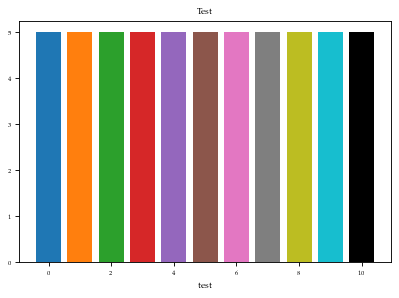

In [8]:
text_width = 5.50107 # in  --> Confirmed with template explanation

golden_ratio = (5**.5 - 1) / 2

import matplotlib
# matplotlib.use('pgf')
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
import matplotlib.lines as mlines

fs_m1 = 6  # for figure ticks
fs = 8  # for regular figure text
fs_p1 = 8  #  figure titles

lw = 0.75
# ms = 0.6

matplotlib.rc('font', serif='Times')
    
matplotlib.rc('font', size=fs)          # controls default text sizes
matplotlib.rc('axes', titlesize=fs)     # fontsize of the axes title
matplotlib.rc('axes', labelsize=fs)    # fontsize of the x and y labels
matplotlib.rc('xtick', labelsize=fs_m1)    # fontsize of the tick labels
matplotlib.rc('ytick', labelsize=fs_m1)    # fontsize of the tick labels
matplotlib.rc('legend', fontsize=fs_m1)    # legend fontsize
matplotlib.rc('figure', titlesize=fs_p1)  # fontsize of the figure title


matplotlib.rc('font',**{'family':'serif','serif':['Palatino']})
matplotlib.rcParams['text.latex.preamble'] = [
       r'\usepackage{siunitx}',   # i need upright \micro symbols, but you need...
       r'\sisetup{detect-all}',   # ...this to force siunitx to actually use your fonts
       r'\usepackage{helvet}',    # set the normal font here
       r'\usepackage{sansmath}',  # load up the sansmath so that math -> helvet
       r'\sansmath'               # <- tricky! -- gotta actually tell tex to use!
]  
matplotlib.rc('text', usetex=True)


matplotlib.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]


base_c11k = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
            '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#000000']



i = range(len(base_c11k))
a = [5]*len(base_c11k)


plt.figure(dpi=80)
plt.bar(i,a, color=base_c11k)
plt.title('Test')
plt.xlabel('test')
plt.show()

In [9]:
def plot_rot_stats(df, stat, conditions, add_cond, ax, formatting, **kwargs):
    filt = (df[list(conditions)] == pd.Series(conditions)).all(axis=1)
    df_filt = df[filt].dropna(subset=[stat]).copy()
    df_filt = df_filt[df_filt.corruption == 0.]
    df_filt = df_filt[df_filt.dataset == "MNIST"]
    
    for idx, mode in enumerate(list(add_cond)):
        filt_add = (df_filt[list(add_cond[mode])] == pd.Series(add_cond[mode])).all(axis=1)
        df_filt_add = df_filt[filt_add]
        
        
        rot_stats = df_filt_add[df_filt_add["mode"] == mode].groupby(['rotation'])[stat]
        mean = rot_stats.mean()
        std = rot_stats.std()
        
        x = np.arange(0, 181, 15)
        errorfill(x, mean, std, alpha_fill=0.2, color=formatting[mode]["color"],
                  linestyle=formatting[mode]["linestyle"], ax=ax, **kwargs)
        ax.scatter(x, mean, s=4, color=formatting[mode]["color"], marker=formatting[mode]["marker"], **kwargs)
        
def plot_cor_stats(df, stat, conditions, add_cond, ax, formatting, cifar="10", **kwargs):
    filt = (df[list(conditions)] == pd.Series(conditions)).all(axis=1)
    df_filt = df[filt].dropna(subset=[stat]).copy()
    df_filt = df_filt[df_filt.rotation == 0.]
    df_filt = df_filt[df_filt.dataset == "CIFAR" + cifar]
    
    for idx, mode in enumerate(list(add_cond)):
        filt_add = (df_filt[list(add_cond[mode])] == pd.Series(add_cond[mode])).all(axis=1)
        df_filt_add = df_filt[filt_add]
        
        
        rot_stats = df_filt_add[df_filt_add["mode"] == mode].groupby(['corruption'])[stat]
        mean = rot_stats.mean()
        std = rot_stats.std()
        
        x = np.arange(0, 6, 1)
        errorfill(x, mean, std, alpha_fill=0.2, color=formatting[mode]["color"],
                  linestyle=formatting[mode]["linestyle"], ax=ax, **kwargs)
        ax.scatter(x, mean, s=4, color=formatting[mode]["color"], marker=formatting[mode]["marker"], **kwargs)

In [10]:
c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
     '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

formatting = {
    "linearized_approx": {"color": c[0], "linestyle": "-", "marker": "o", "label": "Ours"},
    "diaglaplace": {"color": c[4], "linestyle": (0, [6, 2, 1, 2, 1, 2]), "marker": "o", "label": "Diag-Lap"}, 
    "dropout": {"color": c[3], "linestyle": ":", "marker": "o", "label": "Dropout"},
    "ensemble": {"color": c[9], "linestyle": (0, [6, 1, 4, 1, 2, 1]), "marker": "o", "label": "Ensemble"},
    "map": {"color": c[1], "linestyle": "--", "marker": "o", "label": "MAP"},
    "swag": {"color": c[2], "linestyle": "-.", "marker": "o", "label": "SWAG"}, 
#     "lastlaplace": {"color": c[5], "linestyle": (0, [6, 1, 4, 1, 2, 1]), "marker": "o", "label": "Last-Lap"},
}

add_cond = {
    "diaglaplace": {},
    "dropout": {},
    "map": {},
    "swag": {},
#     "lastlaplace": {}
    "ensemble": {},
    "linearized_approx": {},
}

method="min-wass-swag"
hessian_method = "ggn"
pred_lambs = [500.0, np.Inf]
diaglaplace_lamb = 40000.0
modes = ["linearized_approx", "map", "dropout", "diaglaplace", "swag", "ensemble"]
tmp_df = filter_results(res_df, prune_percent=99.62, prune_method=method,
                        pred_lambs=pred_lambs, diaglaplace_lamb=diaglaplace_lamb,
                        modes=modes, hessian_method=hessian_method, filter_dict={})
tmp_df_max_samp = tmp_df.sort_values(by="n_samples").groupby(["mode", "prune_percent", "prune_method", "rotation", "corruption", "target_dataset", "pred_lamb", "hessian_method", "number"]).nth(-1).reset_index()


scale=1
dpi = 800



#### 4 plot config

/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will b

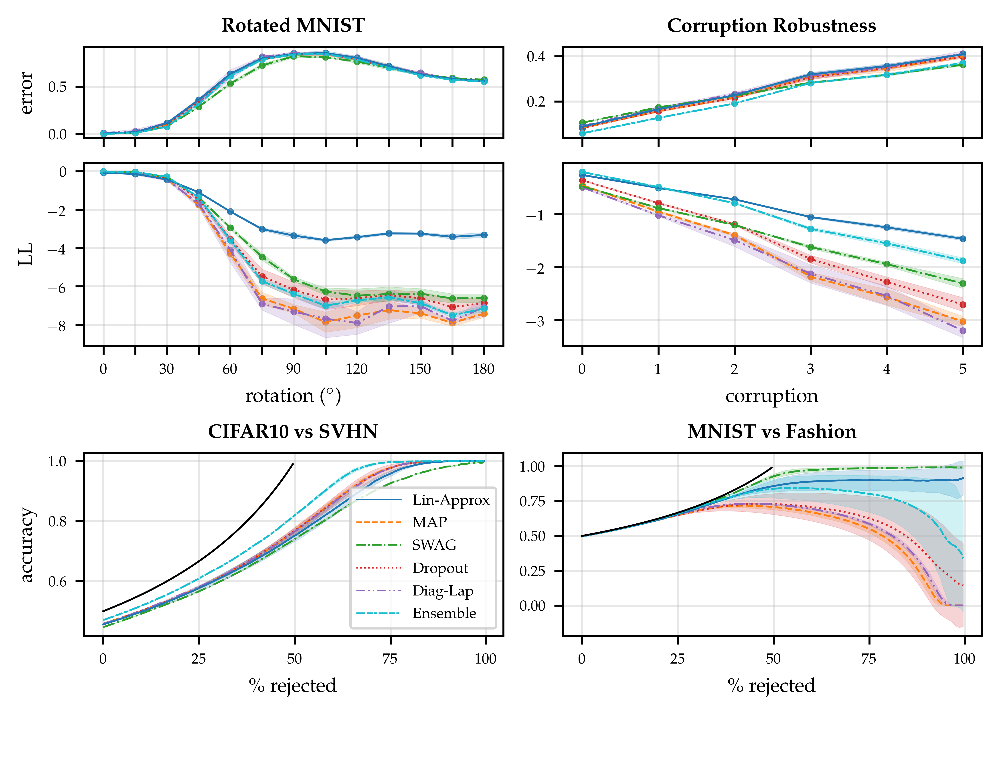

In [78]:
fig = plt.figure(constrained_layout=True, dpi=dpi,
                 figsize=(scale*text_width, 2*scale*text_width*golden_ratio/1.6))

gs = GridSpec(11, 12, figure=fig)
ax1 = plt.subplot(gs.new_subplotspec((0, 0), rowspan=2, colspan=6))
ax2 = plt.subplot(gs.new_subplotspec((0, 6), rowspan=2, colspan=6))
ax3 = plt.subplot(gs.new_subplotspec((2, 0), rowspan=4, colspan=6), sharex=ax1)
ax4 = plt.subplot(gs.new_subplotspec((2, 6), rowspan=4, colspan=6), sharex=ax2)

ax5 = plt.subplot(gs.new_subplotspec((6, 0), rowspan=4, colspan=6))
ax6 = plt.subplot(gs.new_subplotspec((6, 6), rowspan=4, colspan=6))

[axi.grid(alpha=0.3, axis='both') for axi in [ax1, ax2, ax3, ax4, ax5, ax6]]

plot_rot_stats(tmp_df_max_samp, "err", {}, add_cond, ax1, formatting, lw=lw)
plot_rot_stats(tmp_df_max_samp, "ll", {}, add_cond, ax3, formatting, lw=lw)

ax1.set_title("\\textbf{Rotated MNIST}")
ax1.set_ylabel("error")
ax1.tick_params(axis='x', labelbottom=False)

ax3.set_ylabel("LL")
ax3.set_xlabel("rotation ($^{\\circ}$)")
ax3.set_xticks(range(0, 181, 15))
ax3.set_xticklabels([str(i) if i % 2 == 0 else "" for i in range(0, 181, 15)])

plot_cor_stats(tmp_df_max_samp, "err", {}, add_cond, ax2, formatting, lw=lw)
plot_cor_stats(tmp_df_max_samp, "ll", {}, add_cond, ax4, formatting, lw=lw)

ax2.set_title("\\textbf{Corrupted CIFAR10}")
ax2.tick_params(axis='x', labelbottom=False)

ax4.set_xlabel("corruption")


plot_err_props(tmp_df, {"dataset": "CIFAR10", "target_dataset": "SVHN"},
               add_cond, ax5, formatting, lw=lw)

plot_err_props(tmp_df, {"dataset": "MNIST", "target_dataset": "Fashion"},
               add_cond, ax6, formatting, lw=lw)


ax5.set_title("\\textbf{CIFAR10 vs SVHN}")
ax5.set_xlabel("$\%$ rejected")
ax5.set_ylabel("accuracy")
ax5.set_xticks([0., .25, .50, .75,  1.0])
ax5.set_xticklabels(["0", "25", "50", "75", "100"])

ax6.set_title("\\textbf{MNIST vs Fashion}")
ax6.set_xlabel("$\%$ rejected")
ax6.set_xticks([0., .25, .50, .75,  1.0])
ax6.set_xticklabels(["0", "25", "50", "75", "100"])

legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"], label=val["label"], lw=0.6, ms=0.6))

ax5.legend(handles=legend_items, handlelength=3)

fig.align_ylabels()

plt.savefig('img_res_4_config.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
plt.show()

#### 3 plot config

/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will b

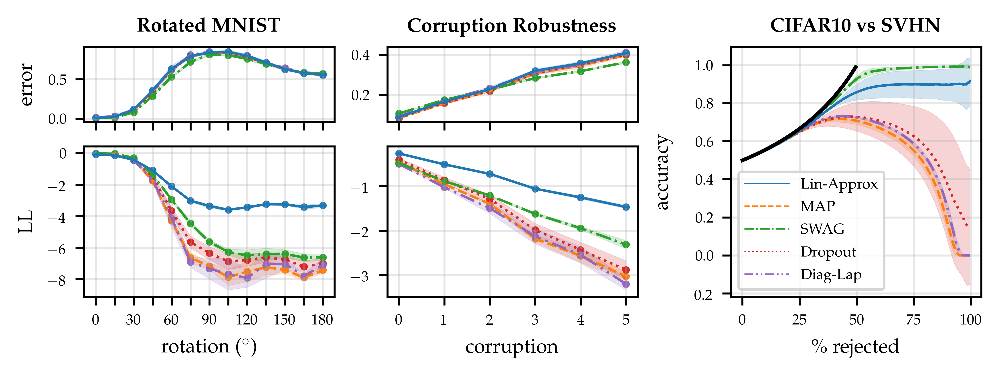

In [15]:
fig = plt.figure(constrained_layout=True, dpi=dpi,
                 figsize=(scale*text_width, 1*scale*text_width*golden_ratio/1.7))

gs = GridSpec(6, 18, figure=fig)
ax1 = plt.subplot(gs.new_subplotspec((0, 0), rowspan=2, colspan=6))
ax2 = plt.subplot(gs.new_subplotspec((0, 6), rowspan=2, colspan=6))
ax3 = plt.subplot(gs.new_subplotspec((2, 0), rowspan=4, colspan=6), sharex=ax1)
ax4 = plt.subplot(gs.new_subplotspec((2, 6), rowspan=4, colspan=6), sharex=ax2)

ax5 = plt.subplot(gs.new_subplotspec((0, 12), rowspan=6, colspan=6))


[axi.grid(alpha=0.3, axis='both') for axi in [ax1, ax2, ax3, ax4, ax5]]

plot_rot_stats(tmp_df, "err", {}, add_cond, ax1, formatting)
plot_rot_stats(tmp_df, "ll", {}, add_cond, ax3, formatting)

ax1.set_title("\\textbf{Rotated MNIST}")
ax1.set_ylabel("error")
ax1.tick_params(axis='x', labelbottom=False)

ax3.set_ylabel("LL")
ax3.set_xlabel("rotation ($^{\\circ}$)")
ax3.set_xticks(range(0, 181, 15))
ax3.set_xticklabels([str(i) if i % 2 == 0 else "" for i in range(0, 181, 15)])

plot_cor_stats(tmp_df, "err", {}, add_cond, ax2, formatting)
plot_cor_stats(tmp_df, "ll", {}, add_cond, ax4, formatting)

ax2.set_title("\\textbf{Corrupted CIFAR10}")
ax2.tick_params(axis='x', labelbottom=False)

ax4.set_xlabel("corruption")
ax4.set_xticks(range(0, 6, 1))


# plot_err_props(tmp_df, {"dataset": "CIFAR10", "target_dataset": "SVHN"},
#                add_cond, ax5, formatting)
plot_err_props(tmp_df, {"dataset": "MNIST", "target_dataset": "Fashion"},
               add_cond, ax5, formatting)

ax5.set_title("\\textbf{CIFAR10 vs SVHN}")
ax5.set_xlabel("$\%$ rejected")
ax5.set_ylabel("accuracy")
ax5.set_xticks([0., .25, .50, .75,  1.0])
ax5.set_xticklabels(["0", "25", "50", "75", "100"])


legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"], label=val["label"], lw=0.6, ms=1))

ax5.legend(handles=legend_items, handlelength=3)

fig.align_ylabels()
plt.savefig('img_res_3_config.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
plt.show()

#### Two plot config

/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will b

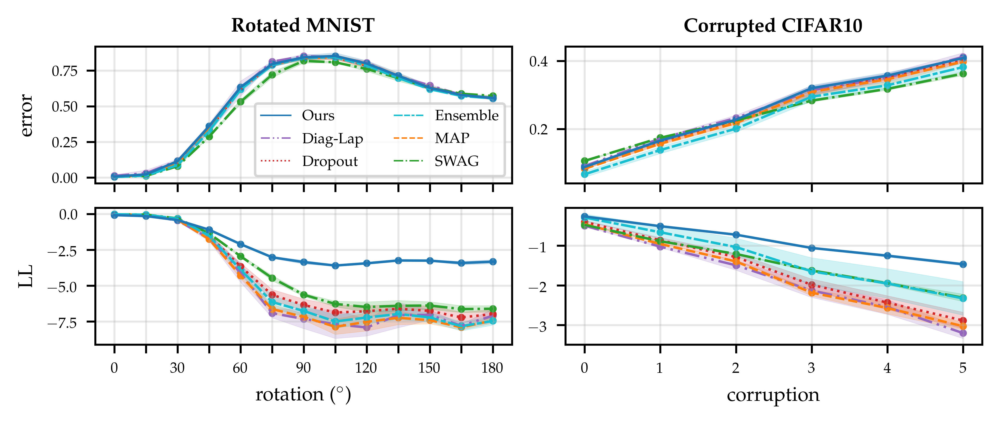

In [11]:
fig = plt.figure(constrained_layout=True, dpi=dpi,
                 figsize=(scale*text_width, 1*scale*text_width*golden_ratio/1.5))

gs = GridSpec(8, 12, figure=fig)
ax1 = plt.subplot(gs.new_subplotspec((0, 0), rowspan=4, colspan=6))
ax2 = plt.subplot(gs.new_subplotspec((0, 6), rowspan=4, colspan=6))
ax3 = plt.subplot(gs.new_subplotspec((4, 0), rowspan=4, colspan=6), sharex=ax1)
ax4 = plt.subplot(gs.new_subplotspec((4, 6), rowspan=4, colspan=6), sharex=ax2)


[axi.grid(alpha=0.3, axis='both') for axi in [ax1, ax2, ax3, ax4]]

plot_rot_stats(tmp_df, "err", {}, add_cond, ax1, formatting)
plot_rot_stats(tmp_df, "ll", {}, add_cond, ax3, formatting)

ax1.set_title("\\textbf{Rotated MNIST}")
ax1.set_ylabel("error")
ax1.tick_params(axis='x', labelbottom=False)

ax3.set_ylabel("LL")
ax3.set_xlabel("rotation ($^{\\circ}$)")
ax3.set_xticks(range(0, 181, 15))
ax3.set_xticklabels([str(i) if i % 2 == 0 else "" for i in range(0, 181, 15)])

plot_cor_stats(tmp_df, "err", {}, add_cond, ax2, formatting)
plot_cor_stats(tmp_df, "ll", {}, add_cond, ax4, formatting)

ax2.set_title("\\textbf{Corrupted CIFAR10}")
ax2.tick_params(axis='x', labelbottom=False)

ax4.set_xlabel("corruption")
ax4.set_xticks(range(0, 6, 1))


legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"], label=val["label"], lw=0.6, ms=2))

ax1.legend(handles=legend_items, ncol=2)
# ax4.legend(handles=legend_items, ncol=6, loc='upper center', 
#          bbox_to_anchor=(-0.05, -0.35))

fig.align_ylabels()
plt.savefig('img_res_main_text.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
plt.show()

#### Rec-class

/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  


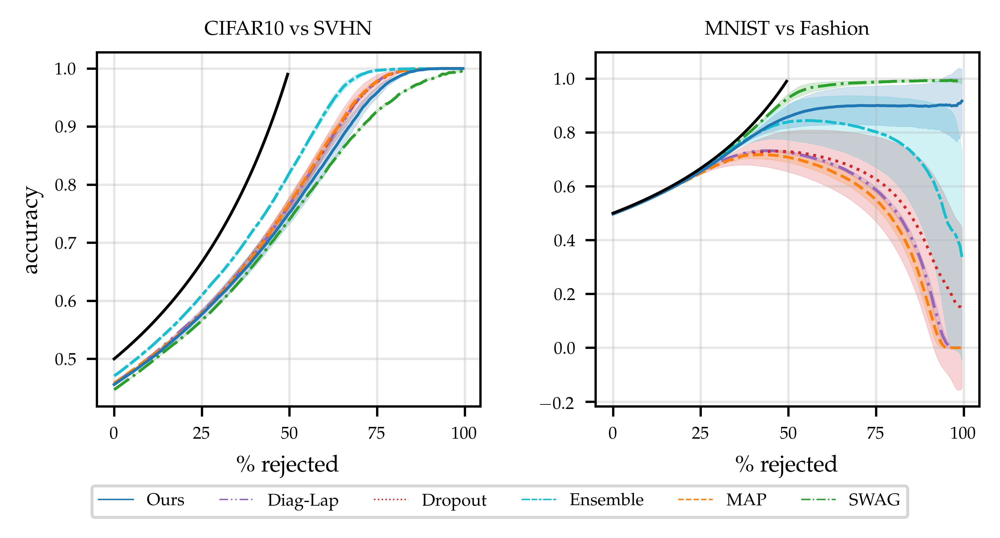

In [13]:
# c = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
#      '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

# formatting = {
#     "map": {"color": c[0], "linestyle": "-", "marker": "o", "label": "MAP"},
#     "dropout": {"color": c[2], "linestyle": "-.", "marker": "o", "label": "Dropout"}, 
#     "diaglaplace": {"color": c[3], "linestyle": ":", "marker": "o", "label": "Diag-Lap"}, 
#     "swag": {"color": c[1], "linestyle": "--", "marker": "o", "label": "SWAG"},
#     "linearized_approx": {"color": c[6], "linestyle": (0, [6, 2, 1, 2, 1, 2]), "marker": "o", "label": "Lin-Approx"},
# #     "dropout (0.3)": {"color": c[7], "linestyle": ":", "marker": "p", "label": "Dropout (0.3)"},
# }

# add_cond = {
#     "map": {},
#     "dropout": {},
#     "diaglaplace": {},
#     "swag": {},
#     "linearized_approx": {},
# }

# fs_m1 = 6  # for figure ticks
# fs = 8  # for regular figure text
# fs_p1 = 8  #  figure titles
# text_width = 5.50107 # in  --> Confirmed with template explanation
# # column_width = 3.25063 # in --> Confirmed with template explanation
# golden_ratio = (5**.5 - 1) / 2
# dpi = 400
# scale = 1
# fill = 0.66

# method="min-wass-swag"
# hessian_method = "ggn"
# #modes = ["map", "map_pruned", "linearized_approx", "linearized_final_layer_sampled"]
# modes = ["linearized_approx", "map", "dropout", "diaglaplace", "swag"]
# pred_lambs = [500.0, np.Inf]
# diaglaplace_lamb = 40000.0
# tmp_df = filter_results(res_df, prune_percent=99.62, prune_method=method,
#                         pred_lambs=pred_lambs, diaglaplace_lamb=diaglaplace_lamb,
#                         modes=modes, hessian_method=hessian_method, filter_dict={})
fig, ax = plt.subplots(nrows=1, ncols=2, dpi=dpi, constrained_layout=False, sharex="all",
                       figsize=(scale*text_width, scale*text_width*golden_ratio/1.5))

plot_err_props(tmp_df, {"dataset": "CIFAR10", "target_dataset": "SVHN"},
               add_cond, ax[0], formatting)
plot_err_props(tmp_df, {"dataset": "MNIST", "target_dataset": "Fashion"},
               add_cond, ax[1], formatting)

legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"],
                                      label=val["label"], lw=0.5, ms=2))
ax[1].legend(handles=legend_items, ncol=6, loc='upper center', 
         bbox_to_anchor=(-0.25, -0.2))

# ax.grid(alpha=0.3, axis='both')
[axi.grid(alpha=0.3, axis='both') for axi in ax]

ax[0].set_title("CIFAR10 vs SVHN", fontsize=fs-1)
ax[1].set_title("MNIST vs Fashion", fontsize=fs-1)


ax[0].set_ylabel("accuracy")

ax[0].set_xlabel("$\%$ rejected")
ax[1].set_xlabel("$\%$ rejected")

ax[0].set_xticks([0., .25, .50, .75,  1.0])
ax[0].set_xticklabels(["0", "25", "50", "75", "100"])

fig.subplots_adjust(wspace=0.3, hspace=0.3)

plt.savefig('rejection_appendix.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
plt.show()

#### Appendix

1
2


/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will b

3
4


/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:22: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:28: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be re

5
6
7
8
9


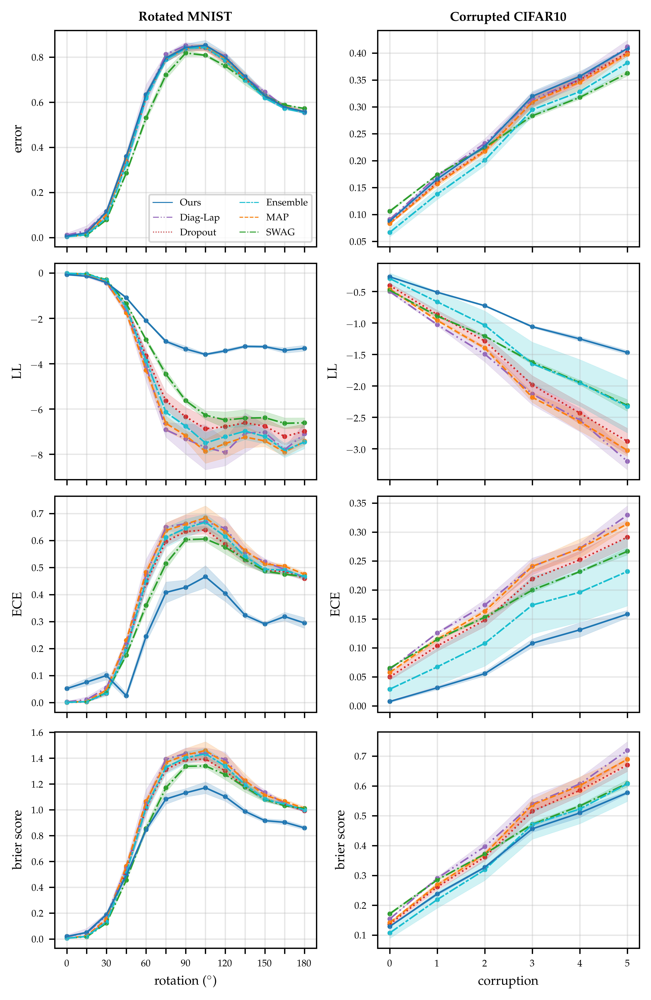

In [12]:
fig = plt.figure(constrained_layout=True, dpi=dpi,
                 figsize=(scale*text_width, 1*scale*text_width*golden_ratio*2.5))

gs = GridSpec(16, 12, figure=fig)
ax1 = plt.subplot(gs.new_subplotspec((0, 0), rowspan=4, colspan=6))
ax2 = plt.subplot(gs.new_subplotspec((0, 6), rowspan=4, colspan=6))
ax3 = plt.subplot(gs.new_subplotspec((4, 0), rowspan=4, colspan=6), sharex=ax1)
ax4 = plt.subplot(gs.new_subplotspec((4, 6), rowspan=4, colspan=6), sharex=ax2)
ax5 = plt.subplot(gs.new_subplotspec((8, 0), rowspan=4, colspan=6), sharex=ax1)
ax6 = plt.subplot(gs.new_subplotspec((8, 6), rowspan=4, colspan=6), sharex=ax2)
ax7 = plt.subplot(gs.new_subplotspec((12, 0), rowspan=4, colspan=6), sharex=ax1)
ax8 = plt.subplot(gs.new_subplotspec((12, 6), rowspan=4, colspan=6), sharex=ax2)

print("1")
[axi.grid(alpha=0.3, axis='both') for axi in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]]


plot_rot_stats(tmp_df, "err", {}, add_cond, ax1, formatting)
ax1.set_title("\\textbf{Rotated MNIST}")
ax1.set_ylabel("error")
ax1.tick_params(axis='x', labelbottom=False)
print("2")
plot_rot_stats(tmp_df, "ll", {}, add_cond, ax3, formatting)
ax3.set_ylabel("LL")
ax3.tick_params(axis='x', labelbottom=False)

plot_rot_stats(tmp_df, "ece", {}, add_cond, ax5, formatting)
ax5.set_ylabel("ECE")
ax5.tick_params(axis='x', labelbottom=False)

plot_rot_stats(tmp_df, "brier", {}, add_cond, ax7, formatting)
ax7.set_ylabel("brier score")
ax7.set_xlabel("rotation ($^{\\circ}$)")
ax7.set_xticks(range(0, 181, 15))
ax7.set_xticklabels([str(i) if i % 2 == 0 else "" for i in range(0, 181, 15)])

print("3")

plot_cor_stats(tmp_df, "err", {}, add_cond, ax2, formatting)
ax2.set_title("\\textbf{Corrupted CIFAR10}")
ax2.tick_params(axis='x', labelbottom=False)

print("4")
plot_cor_stats(tmp_df, "ll", {}, add_cond, ax4, formatting)
ax4.set_ylabel("LL")
ax4.tick_params(axis='x', labelbottom=False)

plot_cor_stats(tmp_df, "ece", {}, add_cond, ax6, formatting)
ax6.set_ylabel("ECE")
ax6.tick_params(axis='x', labelbottom=False)

plot_cor_stats(tmp_df, "brier", {}, add_cond, ax8, formatting)
ax8.set_ylabel("brier score")
ax8.set_xlabel("corruption")
ax8.set_xticks(range(0, 6, 1))
print("5")

legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"], label=val["label"], lw=0.6, ms=2))
print("6")
ax1.legend(handles=legend_items, ncol=2)
# ax4.legend(handles=legend_items, ncol=6, loc='upper center', 
#          bbox_to_anchor=(-0.05, -0.35))
print("7")
# fig.align_ylabels()
print("8")
plt.savefig('img_res_app.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
print("9")
plt.show()

#### Single plot configs

/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:8: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will b

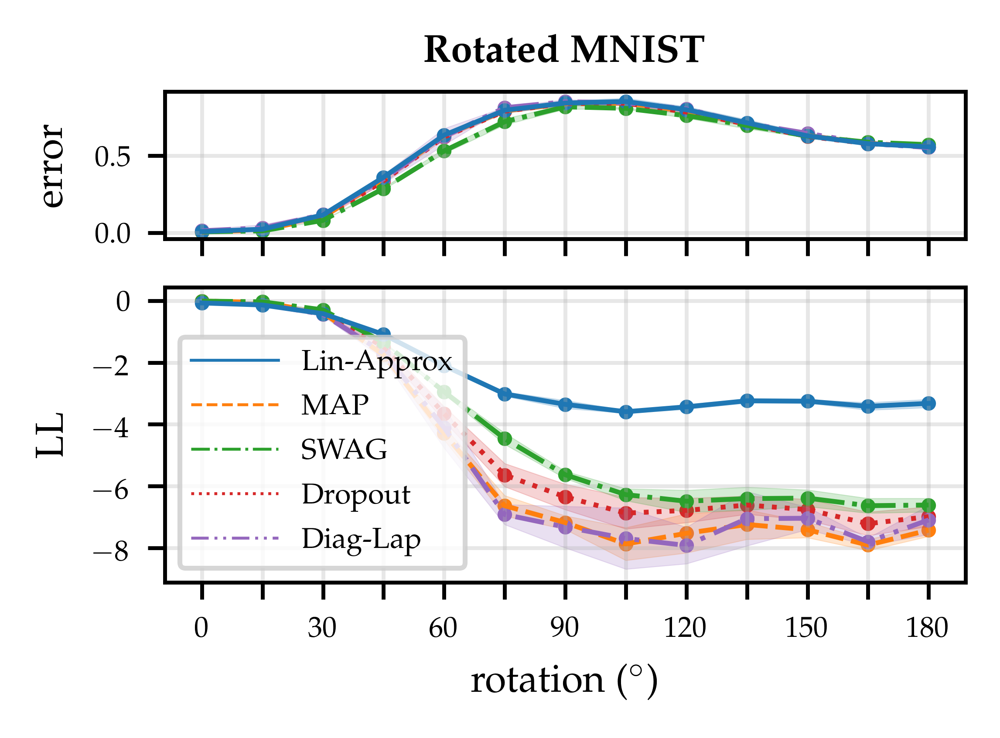

In [18]:
# rot 
fig = plt.figure(constrained_layout=True, dpi=dpi,
                 figsize=(scale*text_width/2, 1*scale*text_width*golden_ratio/1.7))

gs = GridSpec(6, 6, figure=fig)
ax1 = plt.subplot(gs.new_subplotspec((0, 0), rowspan=2, colspan=6))
ax2 = plt.subplot(gs.new_subplotspec((2, 0), rowspan=4, colspan=6), sharex=ax1)

[axi.grid(alpha=0.3, axis='both') for axi in [ax1, ax2]]

plot_rot_stats(tmp_df, "err", {}, add_cond, ax1, formatting)
plot_rot_stats(tmp_df, "ll", {}, add_cond, ax2, formatting)

ax1.set_title("\\textbf{Rotated MNIST}")
ax1.set_ylabel("error")
ax1.tick_params(axis='x', labelbottom=False)

ax2.set_ylabel("LL")
ax2.set_xlabel("rotation ($^{\\circ}$)")
ax2.set_xticks(range(0, 181, 15))
ax2.set_xticklabels([str(i) if i % 2 == 0 else "" for i in range(0, 181, 15)])

legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"], label=val["label"], lw=0.6, ms=1))

ax2.legend(handles=legend_items, handlelength=3)

fig.align_ylabels()
plt.savefig('rot_single.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
plt.show()

/home/jua23/.conda/envs/blt-env/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  


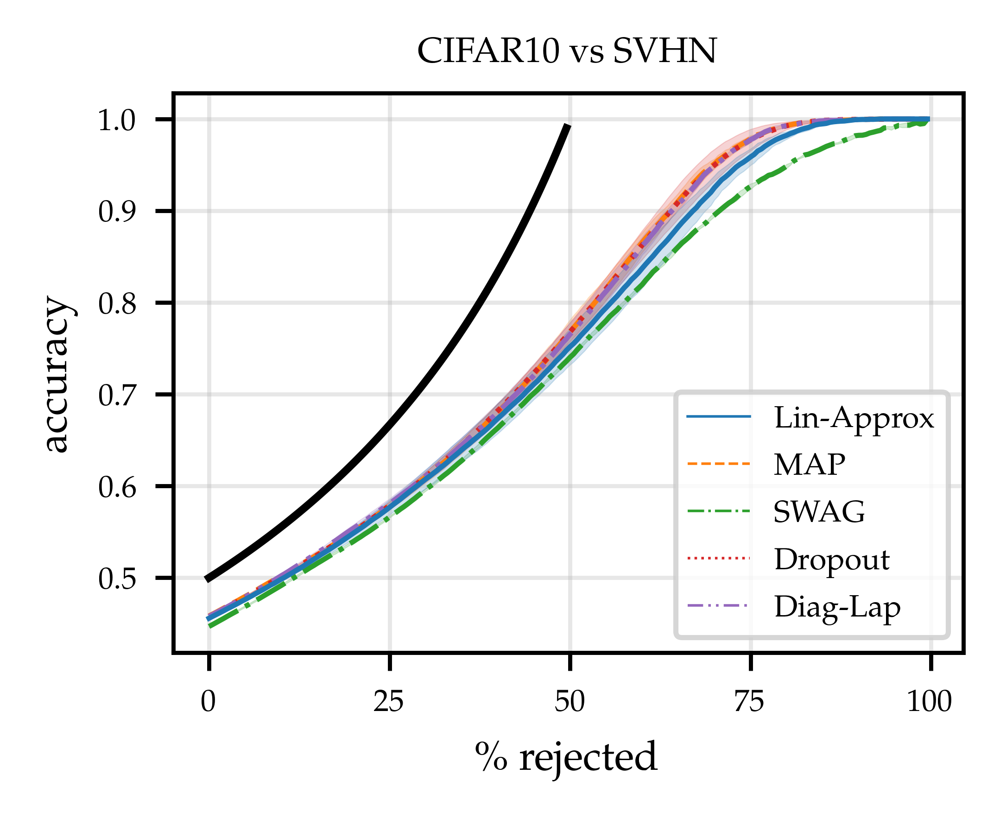

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=1, dpi=dpi, constrained_layout=False, sharex="all",
                       figsize=(scale*text_width/2, 1*scale*text_width*golden_ratio/1.7))

plot_err_props(tmp_df, {"dataset": "CIFAR10", "target_dataset": "SVHN"},
               add_cond, ax, formatting)
# plot_err_props(tmp_df, {"dataset": "MNIST", "target_dataset": "Fashion"},
#                add_cond, ax, formatting)

legend_items = []
for key, val in formatting.items():
    legend_items.append(mlines.Line2D([], [], color=val["color"],
                                      linestyle=val["linestyle"],
                                      label=val["label"], lw=0.5, ms=2))
ax.legend(handles=legend_items)
ax.grid(alpha=0.3, axis='both')

ax.set_title("CIFAR10 vs SVHN", fontsize=fs-1)
# ax.set_title("MNIST vs Fashion", fontsize=fs-1)


ax.set_ylabel("accuracy")

ax.set_xlabel("$\%$ rejected")
# ax.set_xlabel("$\%$ rejected")

ax.set_xticks([0., .25, .50, .75,  1.0])
ax.set_xticklabels(["0", "25", "50", "75", "100"])

fig.subplots_adjust(wspace=0.3, hspace=0.3)

plt.savefig('rej_single.pdf', format='pdf', bbox_inches='tight', pad_inches=0.01)
plt.show()

#### AUC-ROC Table

In [25]:
def create_aucroc_img_results_table(df):
    df = df.copy(deep=True)
    df = df[df.target_dataset.isin(["Fashion", "SVHN"])]
    df = df.rename(columns={"dataset": "Source", "target_dataset": "Target", "mode": "Method"})
    
    df = (df
          .groupby(["Source", "Target", "Method"])
          .agg({"roc_auc": ["mean", "std"]})
    )

    df.columns = ['_'.join(t).rstrip('_') for t in df.columns.values]

    df["AUC"] = "$" + df.roc_auc_mean.apply("{0:.2f}".format) + " \scriptstyle \pm " + df.roc_auc_std.apply("{0:.2f}".format) + "$"
    df = df.drop(columns=["roc_auc_mean", "roc_auc_std"])
    
#     df = df.unstack(0).unstack(0).dropna(axis=1, how='all').droplevel(0, axis=1)
    df = df.unstack(-1, fill_value="").rename(columns={
        "dropout": "\\textsc{Dropout}",
        "linearized_approx": "\\textsc{Ours}",
        "map": "\\textsc{MAP}",
        "swag": "\\textsc{SWAG}",
        "diaglaplace": "\\textsc{Diag-Lap}",
        "ensemble": "\\textsc{Ensemble}",
        
    })
#     df = df.reindex(columns= [
#         "\\textsc{Ours}",
#         "\\textsc{Dropout}",
#         "\\textsc{Diag-Lap}",
#         "\\textsc{Ensemble}",
#         "\\textsc{MAP}",
#         "\\textsc{SWAG}"
#     ])
    
    df.index.names = ["\\textsc{Source}","\\textsc{Target}"]
    df.columns.name="\\textsc{Method}" 
    
    return df, df.to_latex(multirow=True, escape=False, multicolumn_format='c')

aucroc_img_df, aucroc_latex = create_aucroc_img_results_table(tmp_df)
print(aucroc_latex) 
aucroc_img_df



\begin{tabular}{llllllll}
\toprule
      & {} & \multicolumn{6}{c}{AUC} \\
      & Method &             \textsc{Diag-Lap} &              \textsc{Dropout} &             \textsc{Ensemble} &                 \textsc{Ours} &                  \textsc{MAP} &                 \textsc{SWAG} \\
\textsc{Source} & \textsc{Target} &                               &                               &                               &                               &                               &                               \\
\midrule
CIFAR10 & SVHN &  $0.86 \scriptstyle \pm 0.02$ &  $0.86 \scriptstyle \pm 0.01$ &  $0.91 \scriptstyle \pm 0.00$ &  $0.85 \scriptstyle \pm 0.03$ &  $0.86 \scriptstyle \pm 0.02$ &  $0.83 \scriptstyle \pm 0.00$ \\
MNIST & Fashion &  $0.75 \scriptstyle \pm 0.01$ &  $0.76 \scriptstyle \pm 0.09$ &  $0.88 \scriptstyle \pm 0.08$ &  $0.92 \scriptstyle \pm 0.05$ &  $0.72 \scriptstyle \pm 0.03$ &  $0.97 \scriptstyle \pm 0.01$ \\
\bottomrule
\end{tabular}



AUC  \
Method                                      \textsc{Diag-Lap}   
\textsc{Source} \textsc{Target}                                 
CIFAR10         SVHN             $0.86 \scriptstyle \pm 0.02$   
MNIST           Fashion          $0.75 \scriptstyle \pm 0.01$   

                                                               \
Method                                       \textsc{Dropout}   
\textsc{Source} \textsc{Target}                                 
CIFAR10         SVHN             $0.86 \scriptstyle \pm 0.01$   
MNIST           Fashion          $0.76 \scriptstyle \pm 0.09$   

                                                               \
Method                                      \textsc{Ensemble}   
\textsc{Source} \textsc{Target}                                 
CIFAR10         SVHN             $0.91 \scriptstyle \pm 0.00$   
MNIST           Fashion          $0.88 \scriptstyle \pm 0.08$   

                                                               \
Method                                          \textsc{Ours}   
\textsc{Source} \textsc{Target}                                 
CIFAR10         SVHN             $0.85 \scriptstyle \pm 0.03$   
MNIST           Fashion          $0.92 \scriptstyle \pm 0.05$   

                                                               \
Method                                           \textsc{MAP}   
\textsc{Source} \textsc{Target}                                 
CIFAR10         SVHN             $0.86 \scriptstyle \pm 0.02$   
MNIST           Fashion          $0.72 \scriptstyle \pm 0.03$   

                                                               
Method                                          \textsc{SWAG}  
\textsc{Source} \textsc{Target}                                
CIFAR10         SVHN             $0.83 \scriptstyle \pm 0.00$  
MNIST           Fashion          $0.97 \scriptstyle \pm 0.01$

In [53]:
grp_df = tmp_df[(tmp_df.rotation == 0.0) & (tmp_df.corruption == 0.0)].groupby(["mode", "prune_percent", "prune_method", "rotation", "corruption", "target_dataset", "pred_lamb", "hessian_method"])
grp_df = grp_df.agg({"ll": ["mean", "std"], "err": ["mean", "std"], "ece": ["mean", "std"], "brier": ["mean", "std"]}).reset_index()
# grp_df = grp_df.reset_index()
grp_df.columns = ['_'.join(t).rstrip('_') for t in grp_df.columns.values]
grp_df["LL"] = "$" + grp_df.ll_mean.apply("{0:.2f}".format) + " \scriptstyle \pm " + grp_df.ll_std.apply("{0:.2f}".format) + "$"
grp_df["error"] = "$" + grp_df.err_mean.apply("{0:.2f}".format) + " \scriptstyle \pm " + grp_df.err_std.apply("{0:.2f}".format) + "$"
grp_df["ECE"] = "$" + grp_df.ece_mean.apply("{0:.2f}".format) + " \scriptstyle \pm " + grp_df.ece_std.apply("{0:.2f}".format) + "$"
grp_df["brier score"] = "$" + grp_df.brier_mean.apply("{0:.2f}".format) + " \scriptstyle \pm " + grp_df.brier_std.apply("{0:.2f}".format) + "$"
grp_df = grp_df[["mode", "LL", "error", "ECE", "brier score", "dataset"]]
print(grp_df.to_latex(multirow=True, escape=False, multicolumn_format='c'))
grp_df

\begin{tabular}{llllllrr}
\toprule
{} &               mode &                             LL &                         error &                           ECE &                   brier score &  rotation &  corruption \\
\midrule
0  &        diaglaplace &  $-0.04 \scriptstyle \pm 0.03$ &  $0.01 \scriptstyle \pm 0.01$ &  $0.00 \scriptstyle \pm 0.00$ &  $0.02 \scriptstyle \pm 0.01$ &       0.0 &         0.0 \\
1  &        diaglaplace &  $-0.50 \scriptstyle \pm 0.02$ &  $0.09 \scriptstyle \pm 0.00$ &  $0.06 \scriptstyle \pm 0.00$ &  $0.15 \scriptstyle \pm 0.00$ &       0.0 &         0.0 \\
2  &            dropout &  $-0.21 \scriptstyle \pm 0.20$ &  $0.04 \scriptstyle \pm 0.04$ &  $0.03 \scriptstyle \pm 0.03$ &  $0.07 \scriptstyle \pm 0.07$ &       0.0 &         0.0 \\
3  &           ensemble &  $-0.01 \scriptstyle \pm 0.00$ &  $0.00 \scriptstyle \pm 0.00$ &  $0.00 \scriptstyle \pm 0.00$ &  $0.01 \scriptstyle \pm 0.00$ &       0.0 &         0.0 \\
4  &           ensemble &  $-0.29 \scriptstyle

,mode,LL,error,ECE,brier score,rotation,corruption
0,diaglaplace,$-0.04 \scriptstyle \pm 0.03$,$0.01 \scriptstyle \pm 0.01$,$0.00 \scriptstyle \pm 0.00$,$0.02 \scriptstyle \pm 0.01$,0.0,0.0
1,diaglaplace,$-0.50 \scriptstyle \pm 0.02$,$0.09 \scriptstyle \pm 0.00$,$0.06 \scriptstyle \pm 0.00$,$0.15 \scriptstyle \pm 0.00$,0.0,0.0
2,dropout,$-0.21 \scriptstyle \pm 0.20$,$0.04 \scriptstyle \pm 0.04$,$0.03 \scriptstyle \pm 0.03$,$0.07 \scriptstyle \pm 0.07$,0.0,0.0
3,ensemble,$-0.01 \scriptstyle \pm 0.00$,$0.00 \scriptstyle \pm 0.00$,$0.00 \scriptstyle \pm 0.00$,$0.01 \scriptstyle \pm 0.00$,0.0,0.0
4,ensemble,$-0.29 \scriptstyle \pm 0.09$,$0.07 \scriptstyle \pm 0.01$,$0.03 \scriptstyle \pm 0.02$,$0.11 \scriptstyle \pm 0.02$,0.0,0.0
5,linearized_approx,$-0.07 \scriptstyle \pm 0.01$,$0.01 \scriptstyle \pm 0.00$,$0.05 \scriptstyle \pm 0.01$,$0.02 \scriptstyle \pm 0.00$,0.0,0.0
6,linearized_approx,$-0.27 \scriptstyle \pm 0.00$,$0.09 \scriptstyle \pm 0.00$,$0.01 \scriptstyle \pm 0.00$,$0.13 \scriptstyle \pm 0.00$,0.0,0.0
7,map,$-0.01 \scriptstyle \pm 0.00$,$0.00 \scriptstyle \pm 0.00$,$0.00 \scriptstyle \pm 0.00$,$0.01 \scriptstyle \pm 0.00$,0.0,0.0
8,map,$-0.46 \scriptstyle \pm 0.02$,$0.08 \scriptstyle \pm 0.00$,$0.06 \scriptstyle \pm 0.00$,$0.14 \scriptstyle \pm 0.00$,0.0,0.0
9,swag,$-0.01 \scriptstyle \pm 0.00$,$0.00 \scriptstyle \pm 0.00$,$0.00 \scriptstyle \pm 0.00$,$0.01 \scriptstyle \pm 0.00$,0.0,0.0


### Summarize the evaluations done

In [38]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None): 
    print(res_df.groupby(["mode", "prune_method", "prune_percent", "pred_lamb", "hessian_method", "n_samples", "rotation"]).size())

mode                            prune_method   prune_percent  pred_lamb  hessian_method  n_samples  rotation
linearized_approx               min-mag        99.62          0.1        ggn             1          0           3
                                                                                                    15          3
                                                                                                    30          3
                                                                                                    45          3
                                                                                                    60          3
                                                                                                    75          3
                                                                                                    90          3
                                                                                             

In [ ]:
# tmp_df = tmp_df.groupby(["mode", "prune_percent", "n_samples", "rotation", "corruption", "target_dataset", "lamb"]).agg({
#     'll': ['mean', 'std'],
#     'err': ['mean', 'std'],
#     'ece': ['mean', 'std'],
#     'brier': ['mean', 'std'],
#     'number': 'count'
#     }).fillna(0)
# tmp_df.columns = [' '.join(col).strip() for col in tmp_df.columns.values]
# tmp_df = tmp_df.reset_index()

# tmp_df = tmp_df[tmp_df.prune_percent != 99.90]